Import packages

In [2]:
import os
import time
import re 
import sys

#to supress warnings 
import warnings 
warnings.filterwarnings('ignore')

import pandas as pd 
import numpy as np
import plotly.express as px
import plotly.offline as pyo

#to read stocks from Yahoo
from pandas_datareader.data import DataReader
import yfinance as yf 
from pandas_datareader import data as pdr
from datetime import datetime 

# for data encoding
import category_encoders as ce

# for stationarity checks
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf

from statsmodels.tsa.arima.model import ARIMA

pd.options.plotting.backend = "plotly"
pyo.init_notebook_mode()
yf.pdr_override()

Grab stock data using yfinance 

In [12]:
# Define the stock symbol and the time range
stock_symbols = ["AAPL", "MSFT", "GOOGL"]
#start_date = datetime.now() - pd.DateOffset(years=3)
#end_date = datetime.now()
start_date = datetime(2005, 1, 1)  # January 2018
end_date = datetime(2023, 1, 31)  # January 2023

# Fetch the stock data
stock_data = {}
for symbol in stock_symbols:
    stock_data[symbol] = pdr.get_data_yahoo(symbol, start=start_date, end=end_date)

#Display the first few rows to check
#stock_data["GOOGL"].head()
stock_data["GOOGL"].shape

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


(4550, 6)

Convert stock_data to a panel dataset 

In [13]:
final = []

for symbol in stock_symbols:
    tmp_df = pd.DataFrame()
    vals = stock_data[symbol]['Close'].tolist()

    tmp_df['Series'] = [symbol] * len(vals)
    tmp_df['Date'] = stock_data[symbol].index
    tmp_df['Values'] = vals
    final.append(tmp_df)

panel_data = pd.concat(final)
panel_data.set_index(['Series', 'Date'], inplace=True)

panel_data

Values
Series Date                 
AAPL   2005-01-03   1.130179
       2005-01-04   1.141786
       2005-01-05   1.151786
       2005-01-06   1.152679
       2005-01-07   1.236607
...                      ...
GOOGL  2023-01-24  97.699997
       2023-01-25  95.220001
       2023-01-26  97.519997
       2023-01-27  99.370003
       2023-01-30  96.940002

[13650 rows x 1 columns]

Preprocessing and Checking Stationarity 
- differencing
- log transformation
- log diff returns

Then another preprocessing that focuses on converting the datetime index frequency and using ffill 

In [36]:
#Plotting: Overall Time Series first before preprocessing 
px.line(panel_data.reset_index(), 
        x = 'Date', 
        y = 'Values', 
        color = 'Series',
        title = 'Plot of Time Series')

In [16]:
#Check stationarity 
def check_stationarity(series):
    return adfuller(series, regression = 'c')[1]

In [17]:
# sort values first, then apply residual checks
results = panel_data.sort_values(by = ['Series', 'Date']).groupby(['Series'])['Values'].apply(check_stationarity)

# 100% of time series are not stationary
np.mean(results > .05)

1.0

In [33]:
#Preprocessing, differencing first
differences = panel_data.groupby(['Series'])['Values'].diff().reset_index().dropna()
results_diff = differences.groupby(['Series'])['Values'].apply(check_stationarity)
print("Proportion of non-stationary series after differencing:", np.mean(results_diff > .05))

# plot the differences
px.line(differences, x= 'Date', y = 'Values', color = 'Series')

Proportion of non-stationary series after differencing: 0.0


In [35]:
#Log transformation
log_returns = np.log1p(panel_data).groupby(['Series'])['Values'].diff().reset_index().dropna()
results_log = log_returns.groupby(['Series'])['Values'].apply(check_stationarity)
print("Proportion of non-stationary series after log returns:", np.mean(results_log > .05))

# plot the log differences
px.line(log_returns, x= 'Date', y = 'Values', color = 'Series')

Proportion of non-stationary series after log returns: 0.0


In [34]:
#Difference in log returns
final = []

for symbol in stock_symbols:
    print(f"Processing {symbol}...")

    vals = stock_data[symbol]['Close'].tolist()
    log_diffs = np.log(np.array(vals[1:]) / np.array(vals[:-1]))
    differences_log_diffs = log_diffs[1:] - log_diffs[:-1]
    
    tmp_df = pd.DataFrame()
    tmp_df['Series'] = [symbol] * len(differences_log_diffs)
    tmp_df['Date'] = stock_data[symbol].index[2:]  # Excluded the first two dates because log diff
    tmp_df['Values'] = differences_log_diffs
    final.append(tmp_df)

panel_data_log_diffs = pd.concat(final)
panel_data_log_diffs.set_index(['Series', 'Date'], inplace=True)

results_log_diffs = panel_data_log_diffs.groupby(['Series'])['Values'].apply(check_stationarity)
print("Proportion of non-stationary series after differencing log returns:", np.mean(results_log_diffs > .05))

panel_data_log_diffs_reset = panel_data_log_diffs.reset_index()
px.line(panel_data_log_diffs_reset, x= 'Date', y = 'Values', color = 'Series') 

Processing AAPL...
Processing MSFT...
Processing GOOGL...
Proportion of non-stationary series after differencing log returns: 0.0


In [22]:
panel_data_log_diffs

Values
Series Date                
AAPL   2005-01-05 -0.001498
       2005-01-06 -0.007945
       2005-01-07  0.069508
       2005-01-10 -0.074479
       2005-01-11 -0.061736
...                     ...
GOOGL  2023-01-24 -0.039063
       2023-01-25 -0.004545
       2023-01-26  0.049579
       2023-01-27 -0.005075
       2023-01-30 -0.043551

[13644 rows x 1 columns]

In [23]:
dfs_list = []

#Get each stock symbol
symbols = panel_data_log_diffs.index.get_level_values('Series').unique()
for symbol in symbols:
    #subset dataframe per stock
    subset = panel_data_log_diffs.loc[symbol]

    #convert index to datetime to set frequency and use ffill
    subset.index = pd.to_datetime(subset.index)
    subset = subset.asfreq('B').fillna(method='ffill')

    #convert index back to a period and append series column
    subset.index = subset.index.to_period('D')
    subset['Series'] = symbol
    subset.set_index('Series', append=True, inplace=True)
    subset = subset.swaplevel('Series', 'Date')

    dfs_list.append(subset)

# Concatenate the processed dataframes
panel_data_processed = pd.concat(dfs_list)


In [24]:
panel_data_processed

Values
Series Date                
AAPL   2005-01-05 -0.001498
       2005-01-06 -0.007945
       2005-01-07  0.069508
       2005-01-10 -0.074479
       2005-01-11 -0.061736
...                     ...
GOOGL  2023-01-24 -0.039063
       2023-01-25 -0.004545
       2023-01-26  0.049579
       2023-01-27 -0.005075
       2023-01-30 -0.043551

[14142 rows x 1 columns]

Experimental Arima training
- Setting ARIMA(1,1,0) as fixed
- Varying the window sizes, for this exercised used window size 3, 15, 30

In [25]:
import pandas as pd
import numpy as np
from sktime.forecasting.arima import ARIMA

results_dfs = []

for stock in ['AAPL', 'GOOGL', 'MSFT']:
    data = panel_data_processed.loc[stock]['Values'].dropna()
    
    # Loop over different window sizes
    for window_size in [3, 15, 30]:
        arima_predictions = []
        
        for i in range(len(data) - window_size):
            train_data = data.iloc[i:i+window_size]

            # Fit a fixed ARIMA(1,1,0) model 
            model = ARIMA(order=(1, 1, 0))
            model.fit(train_data)

            # Make one-step-ahead forecasts
            y_pred = model.predict(fh=np.array([1]))

            arima_predictions.append(y_pred[0])

        results_dfs.append((stock, window_size, arima_predictions))

results_dfs

/Users/guhitj/opt/anaconda3/envs/time_series_ensembles/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/guhitj/opt/anaconda3/envs/time_series_ensembles/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/guhitj/opt/anaconda3/envs/time_series_ensembles/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/guhitj/opt/anaconda3/envs/time_series_ensembles/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/guhitj/opt/anaconda3/envs/time_series_ensembles/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization fail

[('AAPL',
  3,
  [0.06348207541872602,
   0.002804030365529356,
   -0.20560252005996182,
   0.09302809471267845,
   0.19162255921164173,
   -0.08840893459886782,
   -0.1669451006269397,
   0.0008601747749555195,
   0.04139919661907236,
   0.0020267832870979746,
   0.02837469207859332,
   -0.02272647830261878,
   0.025280340825362013,
   -0.005229505779954348,
   -0.02650482158466896,
   0.029809274120988574,
   0.029344423216111592,
   -0.02357235073828704,
   -0.032330698964337955,
   -0.0011173347040959944,
   -0.03141273396290388,
   0.07364368466899453,
   -0.02404023987203463,
   -0.016543128575352284,
   -0.0521421500646443,
   0.11384055841692081,
   0.023707621887321787,
   -0.032336734289104795,
   -0.027773096847953656,
   -0.07137387495548998,
   -0.006137289160129997,
   0.07403478586550462,
   -0.006370957049734121,
   0.031929704521752825,
   0.03092791583855351,
   -0.0842095453470009,
   0.026079150727503372,
   -0.0017931403152187716,
   -0.023294543490532664,
   -0.03

Save the predictions and original price for each window size into a dataframe (still in log diff)

In [26]:
results_df = pd.DataFrame(columns=['Stock', 'Window Size', 'Date', 'Original Price', 'ARIMA Prediction'])

for stock, window_size, arima_predictions in results_dfs:
    data = panel_data_processed.loc[stock]['Values'].dropna()
    window_size_predictions = arima_predictions
    date_index = data.index[-len(window_size_predictions):]
    original_prices = data.values[-len(window_size_predictions):]
    
    stock_results = pd.DataFrame({
        'Stock': [stock] * len(window_size_predictions),
        'Window Size': [window_size] * len(window_size_predictions),
        'Date': date_index,
        'Original Price': original_prices,
        'ARIMA Prediction': window_size_predictions
    })

    results_df = pd.concat([results_df, stock_results], ignore_index=True)

results_df

,Stock,Window Size,Date,Original Price,ARIMA Prediction
0,AAPL,3,2005-01-10,-0.074479,0.063482
1,AAPL,3,2005-01-11,-0.061736,0.002804
2,AAPL,3,2005-01-12,0.079777,-0.205603
3,AAPL,3,2005-01-13,0.050350,0.093028
4,AAPL,3,2005-01-14,-0.058481,0.191623
...,...,...,...,...,...
42277,MSFT,30,2023-01-24,-0.012005,0.010506
42278,MSFT,30,2023-01-25,-0.003697,-0.017358
42279,MSFT,30,2023-01-26,0.036177,-0.006531
42280,MSFT,30,2023-01-27,-0.029606,0.021152


Transform the log diff back to its original price
- Store stock in stock_df and convert to datetime
- Loop over stocks and loop over window size
- Created another df (stock_window_df) that filters the specific stock and window size 
- use pivot table so we can see the Stock, Date, Original Price, and separate columns for each window size 

In [31]:
import pandas as pd
import numpy as np

arima_predictions_list = []

for stock in ['AAPL', 'GOOGL', 'MSFT']:
    stock_df = stock_data[stock]
    stock_df.index = pd.to_datetime(stock_df.index)

    for window_size in [3, 15, 30]:
        stock_window_df = results_df[(results_df['Stock'] == stock) & (results_df['Window Size'] == window_size)]
        
        for index, row in stock_window_df.iterrows():
            date = row['Date'].to_timestamp()
            arima_prediction = row['ARIMA Prediction']

            if date in stock_df.index:
                original_price = stock_df.loc[date]['Close']
                arima_prediction_transformed = original_price * np.exp(arima_prediction)
                
                arima_predictions_list.append({
                    'Stock': stock,
                    'Date': date,
                    'Original Price': original_price,
                    'Window Size': window_size, 
                    'ARIMA Prediction Transformed': arima_prediction_transformed
                })

final_arima_predictions_df = pd.DataFrame(arima_predictions_list)

#Use pivot to modify the dataframe to have a column for each window size
final_arima_predictions_df = final_arima_predictions_df.pivot_table(index=['Stock', 'Date', 'Original Price'], 
                                                                    columns='Window Size', 
                                                                    values='ARIMA Prediction Transformed', 
                                                                    aggfunc='first').reset_index()

new_columns = []

for col in final_arima_predictions_df.columns:
    if isinstance(col, int):  
        new_name = f'ARIMA Pred Window {col}'
        new_columns.append(new_name)       
    else:
        new_columns.append(col)

final_arima_predictions_df.columns = new_columns

final_arima_predictions_df



,Stock,Date,Original Price,ARIMA Pred Window 3,ARIMA Pred Window 15,ARIMA Pred Window 30
0,AAPL,2005-01-10,1.231429,1.312137,NaN,NaN
1,AAPL,2005-01-11,1.152857,1.156094,NaN,NaN
2,AAPL,2005-01-12,1.168929,0.951691,NaN,NaN
3,AAPL,2005-01-13,1.246429,1.367947,NaN,NaN
4,AAPL,2005-01-14,1.253571,1.518342,NaN,NaN
...,...,...,...,...,...,...
13630,MSFT,2023-01-24,242.039993,247.801498,246.210098,244.596359
13631,MSFT,2023-01-25,240.610001,220.189601,237.004174,236.469616
13632,MSFT,2023-01-26,248.000000,249.772683,245.318964,246.385709
13633,MSFT,2023-01-27,248.160004,259.648242,253.118541,253.464907


Using the results from the previous block, calculate the metrics 

In [28]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

metrics = []

def calculate_metrics(y_true, y_pred):
    # Remove NaN values
    mask = ~np.isnan(y_pred)
    y_true = y_true[mask]
    y_pred = y_pred[mask]

    mape = mean_absolute_percentage_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    
    return {
        "MAPE": mape,
        "RMSE": rmse,
        "MAE": mae,
    }

stocks = final_arima_predictions_df['Stock'].unique()

for stock in stocks:
    stock_df = final_arima_predictions_df[final_arima_predictions_df['Stock'] == stock]
    
    y_true = stock_df['Original Price']

    for window_size in [3, 15, 30]:
        y_pred = stock_df[window_size]
        if y_pred.isna().all():  # Skip if all values are NaN
            continue

        metrics_values = calculate_metrics(y_true, y_pred)
        
        metrics.append({
            'Stock': stock,
            'Window Size': window_size,
            'MAPE': metrics_values['MAPE'],
            'RMSE': metrics_values['RMSE'],
            'MAE': metrics_values['MAE']
        })

# Create dataframe from metrics 
metrics_df = pd.DataFrame(metrics)

print(metrics_df)


   Stock  Window Size      MAPE      RMSE       MAE
0   AAPL            3  0.036718  3.042192  1.382767
1   AAPL           15  0.015400  1.287420  0.586209
2   AAPL           30  0.013786  1.149081  0.520959
3  GOOGL            3  0.032109  2.433468  1.253958
4  GOOGL           15  0.013593  1.061944  0.531892
5  GOOGL           30  0.012263  0.961308  0.481643
6   MSFT            3  0.030047  5.497722  2.602687
7   MSFT           15  0.012721  2.354879  1.102759
8   MSFT           30  0.011564  2.158125  1.006760


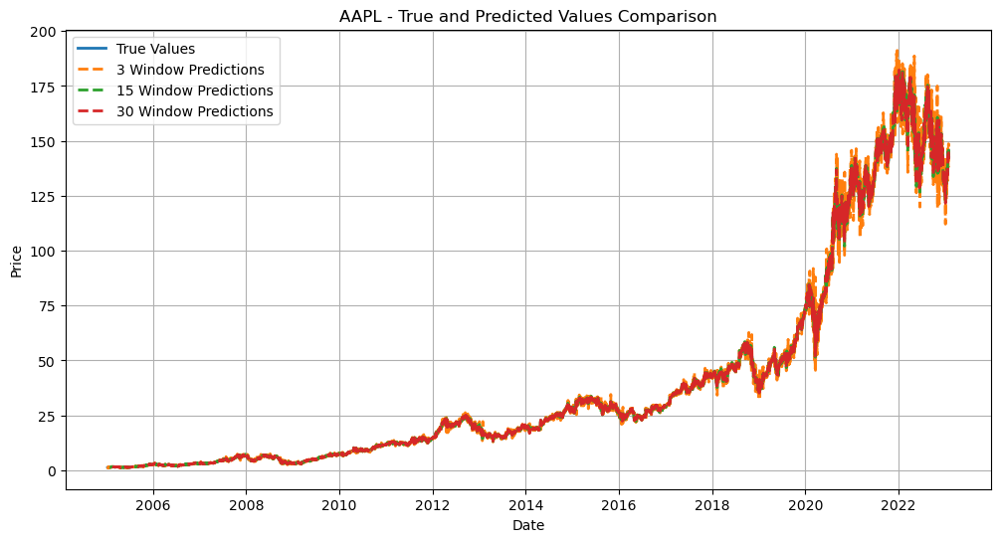

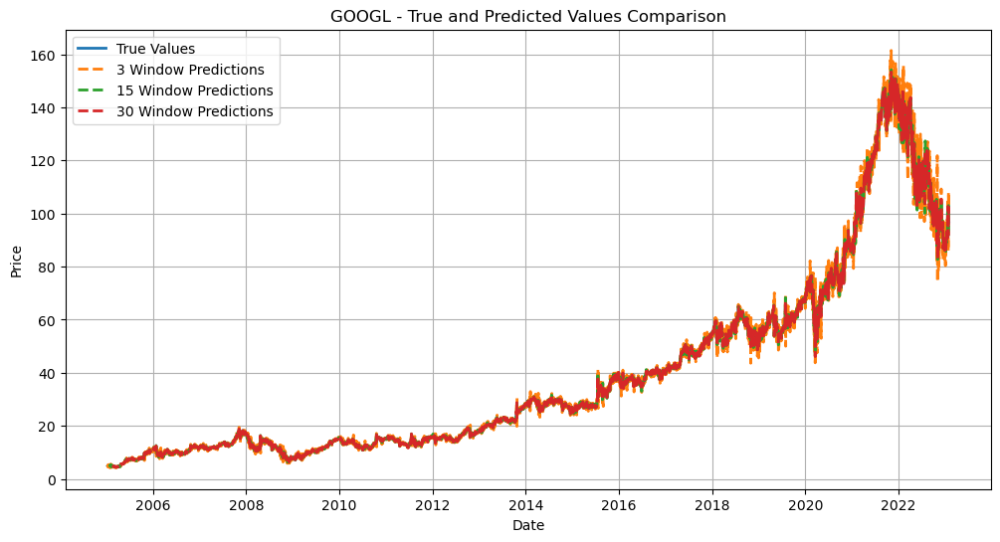

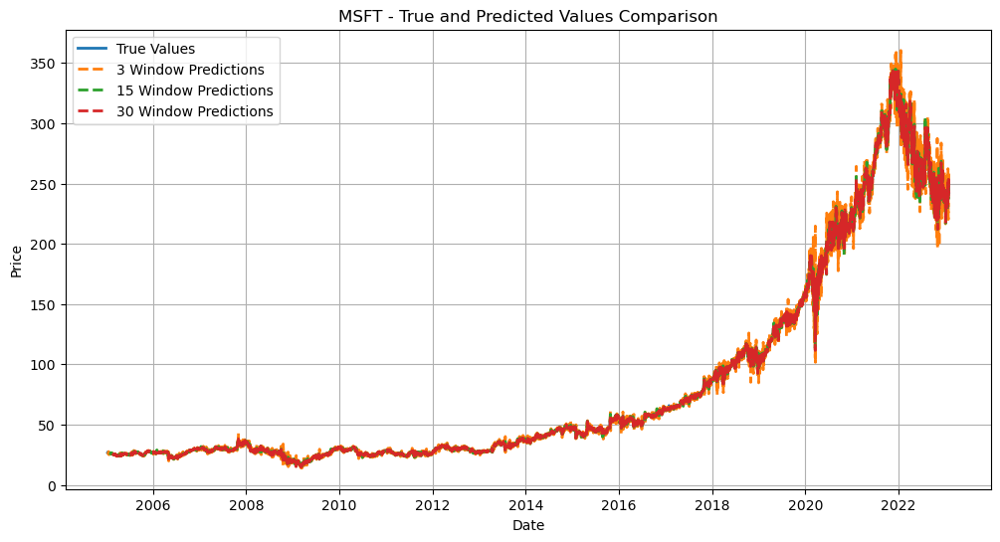

In [29]:
import os
import matplotlib.pyplot as plt
from datetime import datetime

base_dir = '../results'
now = datetime.now()
date_time_str = now.strftime('%Y%m%d_%H%M%S')
new_dir = os.path.join(base_dir, f"arima_experimental_{date_time_str}")

if not os.path.exists(new_dir):
    os.makedirs(new_dir)

window_sizes = [3, 15, 30]
stocks = final_arima_predictions_df['Stock'].unique()

final_arima_predictions_df.to_csv(os.path.join(new_dir, 'final_arima_predictions.txt'), sep='\t', index=False)
metrics_df.to_csv(os.path.join(new_dir, 'metrics.txt'), sep='\t', index=False)

for stock in stocks:
    filtered_df = final_arima_predictions_df[final_arima_predictions_df['Stock'] == stock]

    dates = filtered_df['Date']
    y_true = filtered_df['Original Price']

    plt.figure(figsize=(12, 6))
    plt.plot(dates, y_true, label='True Values', linewidth=2)

    for window_size in window_sizes:
        y_pred = filtered_df[window_size]
        plt.plot(dates, y_pred, label=f'{window_size} Window Predictions', linestyle='--', linewidth=2)

    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title(f'{stock} - True and Predicted Values Comparison')
    plt.legend()
    plt.grid(True)
    plt.savefig(os.path.join(new_dir, f'{stock}_plot.png'))

plt.show()


Save the final predictions and metrics to a txt file and plot the y_true and y_pred for each stock and their corresponding window size

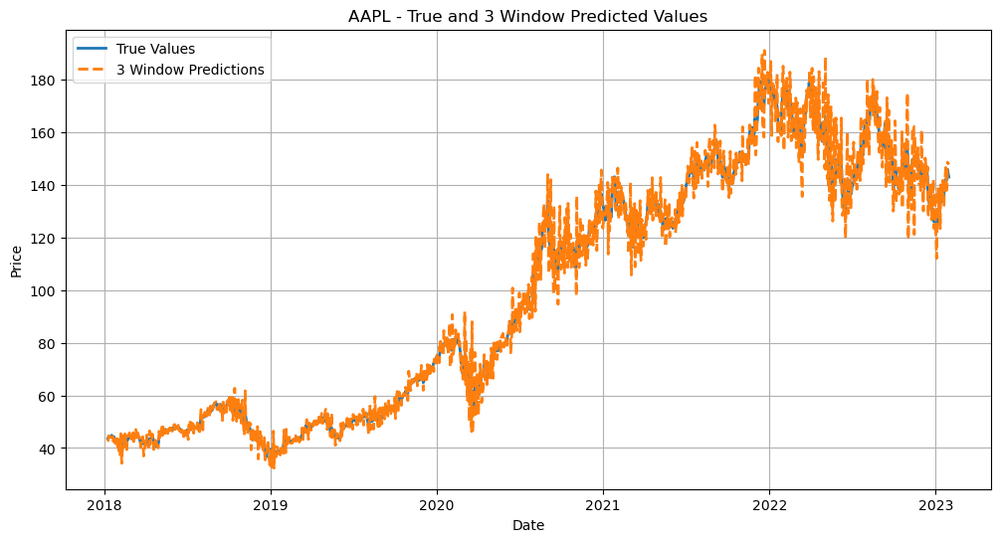

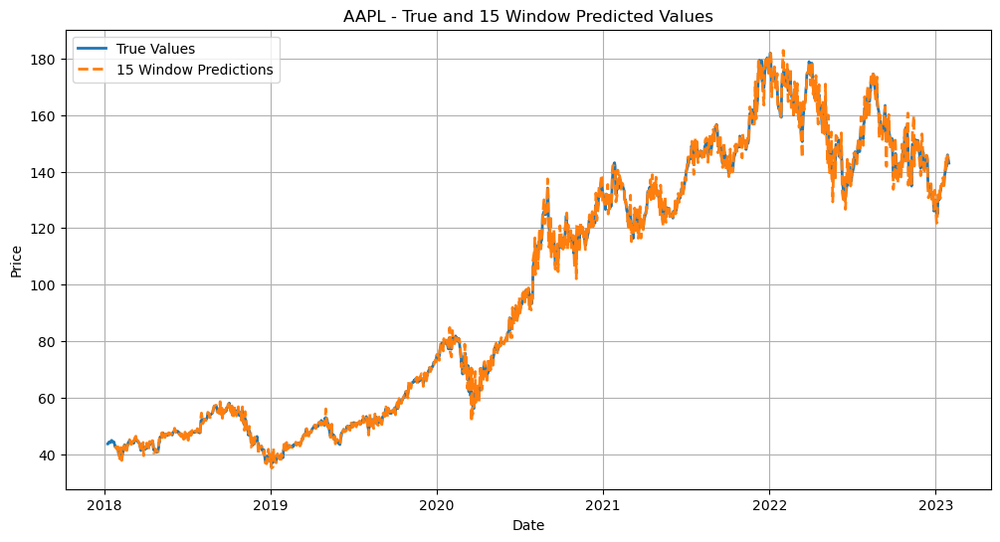

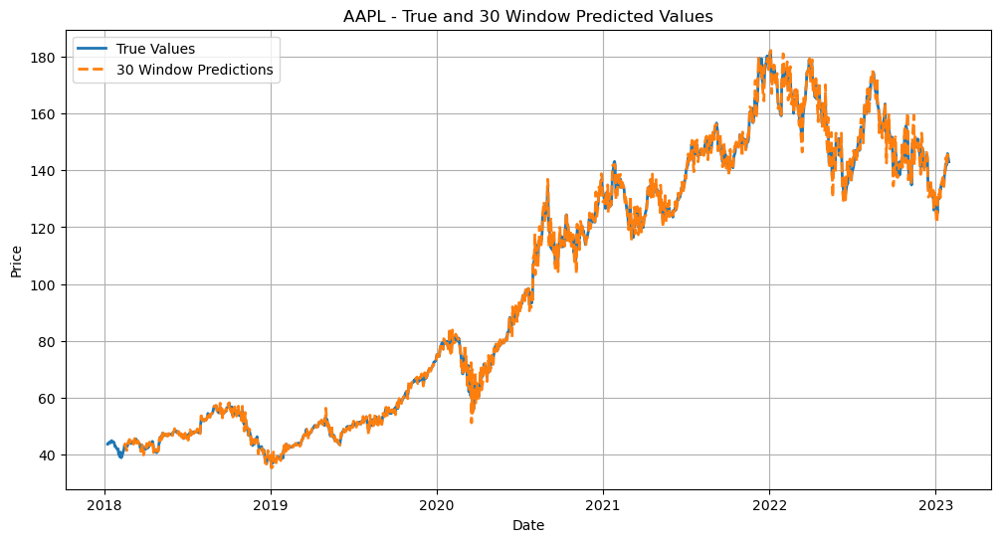

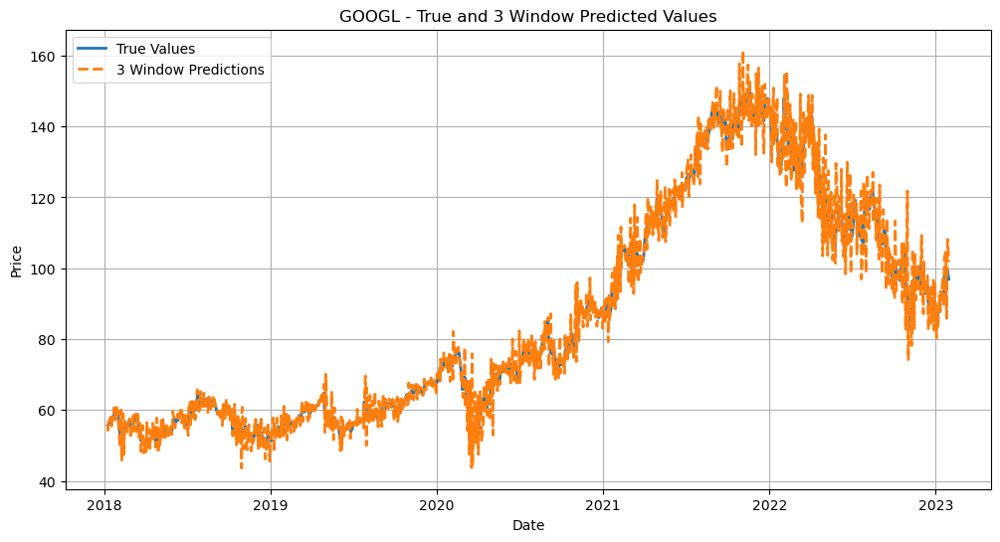

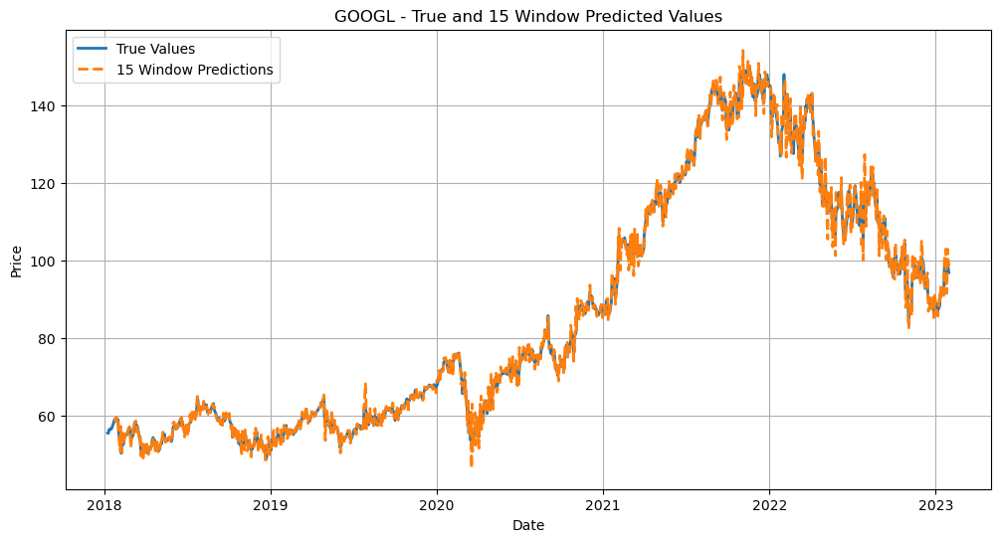

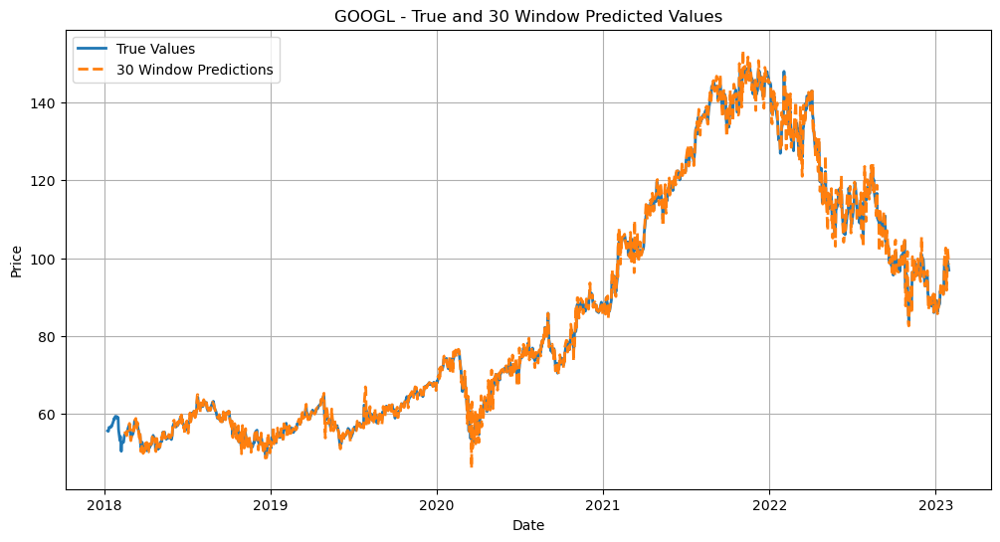

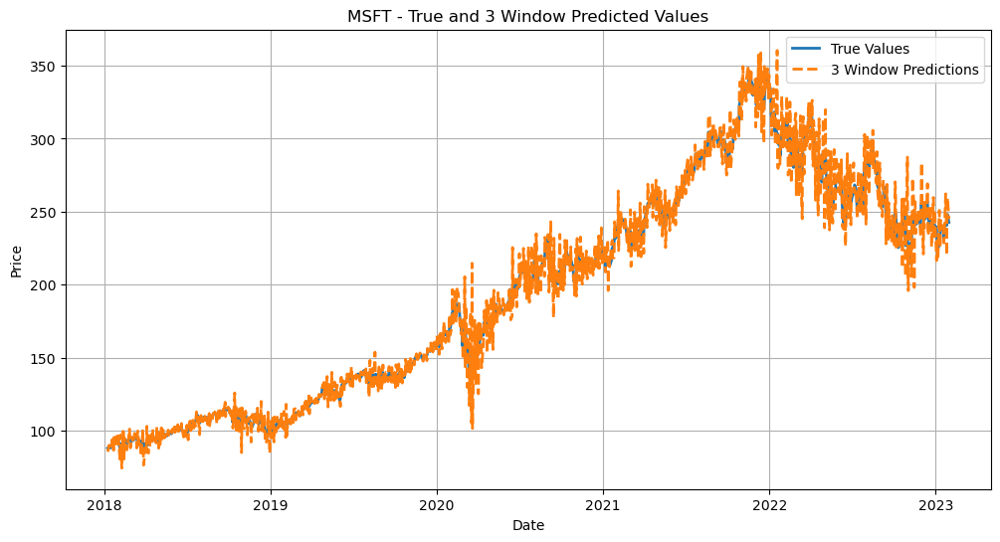

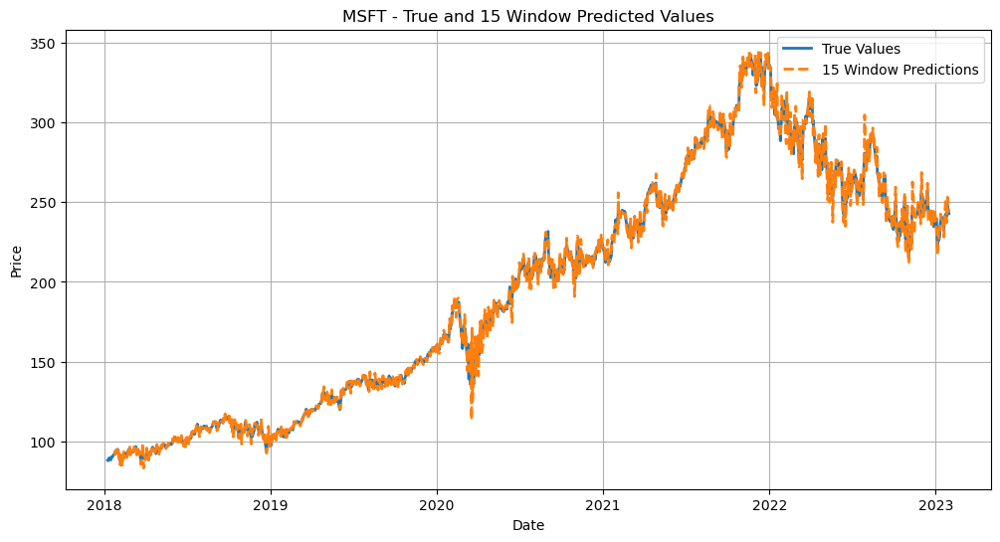

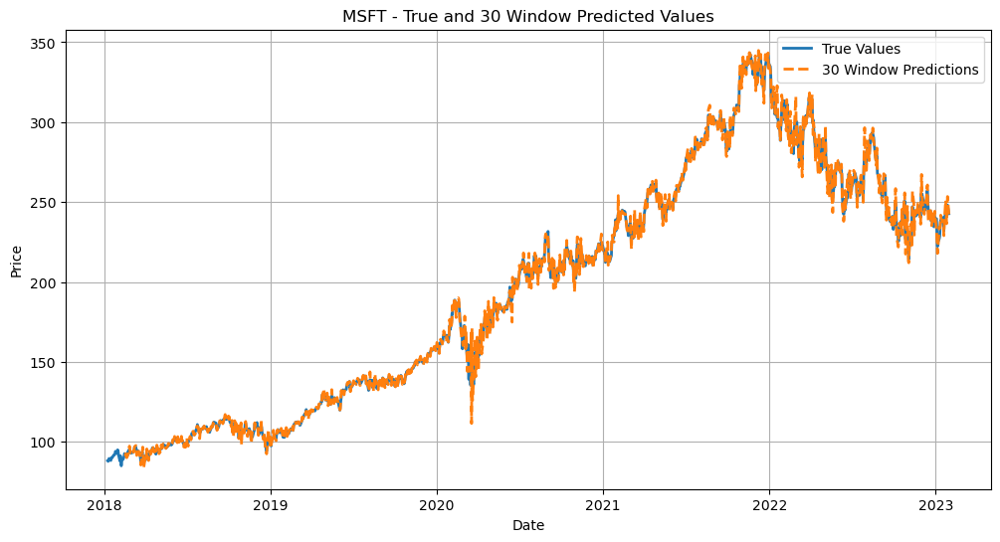

In [33]:
import os
import matplotlib.pyplot as plt
from datetime import datetime

base_dir = '../results'
now = datetime.now()
date_time_str = now.strftime('%Y%m%d_%H%M%S')
new_dir = os.path.join(base_dir, f"arima_experimental_{date_time_str}")

if not os.path.exists(new_dir):
    os.makedirs(new_dir)

final_arima_predictions_df.to_csv(os.path.join(new_dir, 'final_arima_predictions.txt'), sep='\t', index=False)
metrics_df.to_csv(os.path.join(new_dir, 'metrics.txt'), sep='\t', index=False)

window_sizes = [3, 15, 30]
stocks = final_arima_predictions_df['Stock'].unique()

for stock in stocks:
    filtered_df = final_arima_predictions_df[final_arima_predictions_df['Stock'] == stock]
    
    dates = filtered_df['Date']
    y_true = filtered_df['Original Price']
    
    for window_size in window_sizes:
        plt.figure(figsize=(12, 6))
        plt.plot(dates, y_true, label='True Values', linewidth=2)
        
        y_pred = filtered_df[window_size]
        plt.plot(dates, y_pred, label=f'{window_size} Window Predictions', linestyle='--', linewidth=2)
        
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.title(f'{stock} - True and {window_size} Window Predicted Values')
        plt.legend()
        plt.grid(True)
        
        plt.savefig(os.path.join(new_dir, f'{stock}_{window_size}_window_plot.png'))
        plt.show()
